In [1]:
import numpy as np
import pandas as pd

from embeddings.scorer import EmbeddingScorer
from embeddings.embedder import ImageBindEmbedder

C:\Users\user\miniconda3\envs\MusesthAI-39\lib\site-packages\torchvision\transforms\_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
C:\Users\user\miniconda3\envs\MusesthAI-39\lib\site-packages\torchvision\transforms\_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(


In [2]:
images_df = pd.read_csv('../data/images/images_dataset.csv')
images_df.head()

,image_path,embeddings
0,a-mishra_expression-of-sadness-i.jpg,"[0.0019837517756968737, -0.030643584206700325,..."
1,abraham-manievich_quiet-autumn-day.jpg,"[0.017380911856889725, -0.015711871907114983, ..."
2,adam-baltatu_houses-in-hu-i.jpg,"[-0.020841948688030243, -0.03871864825487137, ..."
3,adolf-hiremy-hirschl_the-souls-of-acheron-1898...,"[-0.009365472942590714, -0.023443259298801422,..."
4,adriaen-van-ostade_the-interior-of-a-peasant-s...,"[8.49629141157493e-05, -0.02000182308256626, 0..."


In [14]:
audio_df = pd.read_csv('../data/music/audio_dataset.csv')
audio_df["genre"] = audio_df["audio_path"].apply(lambda x: x.split("\\")[-2])
audio_df.head()

,audio_path,genre,embeddings
0,../data/music\blues\Andrew Christopher Smith -...,blues,"[-0.3491342067718506, -0.42665985226631165, 0...."
1,../data/music\blues\Kevin MacLeod - Dirt Rhode...,blues,"[0.07045378535985947, -0.0043796696700155735, ..."
2,../data/music\blues\Kevin MacLeod - Hustle.mp3,blues,"[0.5887923240661621, -0.16648854315280914, -0...."
3,../data/music\blues\Megatone - Black and White...,blues,"[-0.41986218094825745, 0.004547918681055307, 0..."
4,../data/music\blues\The Wanderer - Coldness.mp3,blues,"[0.3042408525943756, 0.4944038689136505, 0.396..."


# Embeddings Scoring

In [15]:
scorer = EmbeddingScorer()

In [16]:
import ast

results = {"audio_id": [], "image_id": [], "audio_path": [], "image_path": [], "score": []}
image_embs = []
for i, row in images_df.iterrows():
    list_from_str = ast.literal_eval(row['embeddings'])
    image_embs.append(np.array(list_from_str))
image_embs = np.array(image_embs)


for i, row in audio_df.iterrows():
    list_from_str = ast.literal_eval(row['embeddings'])
    emb = np.array(list_from_str).reshape(1, -1)
    top_k, scores = scorer.find_topk(query=emb, targets=image_embs, top_k=5)
    for idx, score in zip(top_k, scores):
        results["audio_id"].append(i)
        results["image_id"].append(idx)
        results["audio_path"].append(row["audio_path"])
        results["image_path"].append(images_df.iloc[idx]["image_path"])
        results["score"].append(score)

In [28]:
res_df = pd.DataFrame(results)
res_df["genre"] = res_df["audio_path"].apply(lambda x: x.split("\\")[-2])
res_df.head()

,audio_id,image_id,audio_path,image_path,score,genre
0,0,293,../data/music\blues\Andrew Christopher Smith -...,lilla-cabot-perry_the-cellist.jpg,0.343190,blues
1,0,91,../data/music\blues\Andrew Christopher Smith -...,danielson-gambogi-elin_pianospelare-1907.jpg,0.271812,blues
2,0,491,../data/music\blues\Andrew Christopher Smith -...,william-merritt-chase_the-song.jpg,0.213920,blues
3,0,142,../data/music\blues\Andrew Christopher Smith -...,francois-boucher_portrait-of-a-lady-with-muff.jpg,0.199956,blues
4,0,288,../data/music\blues\Andrew Christopher Smith -...,laura-knight_les-sylphides-1922.jpg,0.189365,blues


### Show examples for genres

In [9]:
import IPython.display as ipd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

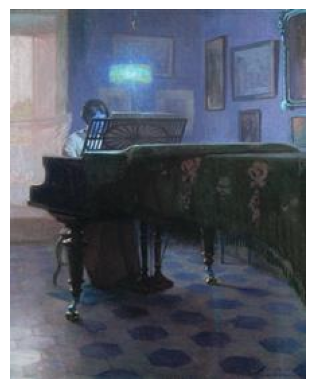

0.3350208336143674
../data/music\classical\Aaron Dunn - Minuet - Notebook for Anna Magdalena.mp3
danielson-gambogi-elin_pianospelare-1907.jpg


In [11]:
classical_row = res_df[res_df["genre"]=="classical"].iloc[0]
image = plt.imread("../data/images/imagesf2/" + classical_row["image_path"],  format="jpg")
if image.shape[-1] == 3 or image.shape[-1] == 4:  # RGBA
    image = image[..., ::-1]
plt.imshow(image)
plt.axis('off')
plt.show()
print(classical_row["score"])
print(classical_row["audio_path"])
print(classical_row["image_path"])
ipd.Audio(classical_row["audio_path"])

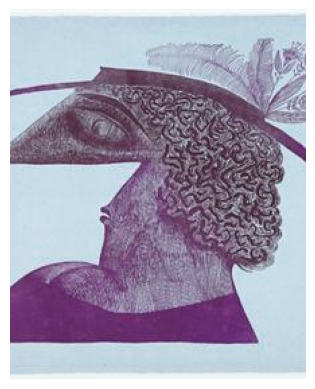

0.2503697733362402
../data/music\jazz\Mentz - Introduction.mp3
saul-steinberg_head-1945.jpg


In [22]:
jazz_row = res_df[res_df["genre"]=="jazz"].iloc[5]
image = plt.imread("../data/images/imagesf2/" + jazz_row["image_path"],  format="jpg")
if image.shape[-1] == 3 or image.shape[-1] == 4:  # RGBA
    image = image[..., ::-1]
plt.imshow(image)
plt.axis('off')
plt.show()
print(jazz_row["score"])
print(jazz_row["audio_path"])
print(jazz_row["image_path"])
ipd.Audio(jazz_row["audio_path"])

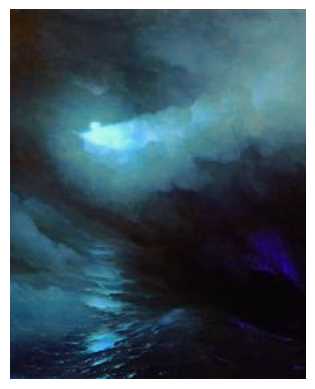

0.2159615732899146
../data/music\rock\Jon Shuemaker - Break it Down.mp3
ivan-aivazovsky_creation-of-the-world-1864.jpg


In [25]:
rock = res_df[res_df["genre"]=="rock"].iloc[12]
image = plt.imread("../data/images/imagesf2/" + rock["image_path"],  format="jpg")
if image.shape[-1] == 3 or image.shape[-1] == 4:  # RGBA
    image = image[..., ::-1]
plt.imshow(image)
plt.axis('off')
plt.show()
print(rock["score"])
print(rock["audio_path"])
print(rock["image_path"])
ipd.Audio(rock["audio_path"])

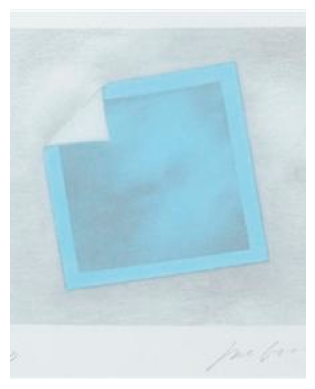

0.16633746737522342
../data/music\hip-Hop\Brakhage - Le Vrai (Instrumental).mp3
joe-goode_untitled-1971.jpg


In [27]:
electronic_row = res_df[res_df["genre"]=="hip-Hop"].iloc[0]
image = plt.imread("../data/images/imagesf2/" + electronic_row["image_path"],  format="jpg")
if image.shape[-1] == 3 or image.shape[-1] == 4:  # RGBA
    image = image[..., ::-1]
plt.imshow(image)
plt.axis('off')
plt.show()
print(electronic_row["score"])
print(electronic_row["audio_path"])
print(electronic_row["image_path"])
ipd.Audio(electronic_row["audio_path"])